In [1]:
!pip install wandb==0.15.0
!wandb --version

  Using cached wandb-0.15.0-py3-none-any.whl.metadata (8.0 kB)
Using cached wandb-0.15.0-py3-none-any.whl (2.0 MB)
wandb, version 0.15.0


In [2]:
!pip install ultralytics

In [3]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [4]:
import os
import cv2
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
import shutil
from shutil import copyfile
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
from PIL import Image
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.2.55  Python-3.10.13 torch-2.3.1+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
Setup complete  (8 CPUs, 7.7 GB RAM, 160.2/476.1 GB disk)


In [5]:
# Create directories
os.makedirs('datasets/train', exist_ok=True)
os.makedirs('datasets/valid', exist_ok=True)
os.makedirs('datasets/test', exist_ok=True)

# Set paths
train_path = 'datasets/train/'
valid_path = 'datasets/valid/'
test_path = 'datasets/test/'

Data Preperation

In [6]:
ano_paths=[]
i=0
for dirname, _, filenames in os.walk(r'C:\projects_sree\miniproject\archive\train-pure\train-pure\labels'):
    for filename in filenames:
        if filename[-4:]=='.txt' and i<100:
            ano_paths+=[(os.path.join(dirname, filename))]
            i+=1
        
n=len(ano_paths) 
print(n)
N=list(range(n))
random.shuffle(N)

train_ratio = 0.6
valid_ratio = 0.2
test_ratio = 0.2

train_size = int(train_ratio*n)
valid_size = int(valid_ratio*n)

train_i = N[:train_size]
valid_i = N[train_size:train_size+valid_size]
test_i = N[train_size+valid_size:]

#print(train_i)
#print(valid_i)
#print(test_i)

100


In [7]:
# Copy files to respective directoriesdef copy_files(indices, label_dest, image_dest):
for idx in train_i:
    ano_path = ano_paths[idx]
    img_path = os.path.join(r'C:\projects_sree\miniproject\archive\train-pure\train-pure\images', os.path.basename(ano_path).replace('.txt', '.jpg'))
    try:
        shutil.copy(ano_path, train_path)
        shutil.copy(img_path, train_path)
    except FileNotFoundError:
        continue
print(len(os.listdir(train_path)))

120


In [8]:
# Copy files to respective directoriesdef copy_files(indices, label_dest, image_dest):
for idx in valid_i:
    ano_path = ano_paths[idx]
    img_path = os.path.join(r'C:\projects_sree\miniproject\archive\train-pure\train-pure\images', os.path.basename(ano_path).replace('.txt', '.jpg'))
    try:
        shutil.copy(ano_path, valid_path)
        shutil.copy(img_path, valid_path)
    except FileNotFoundError:
        continue
print(len(os.listdir(valid_path)))

40


In [9]:
# Copy files to respective directoriesdef copy_files(indices, label_dest, image_dest):
for idx in test_i:
    ano_path = ano_paths[idx]
    img_path = os.path.join(r'C:\projects_sree\miniproject\archive\train-pure\train-pure\images', os.path.basename(ano_path).replace('.txt', '.jpg'))
    try:
        shutil.copy(ano_path, test_path)
        shutil.copy(img_path, test_path)
    except FileNotFoundError:
        continue
print(len(os.listdir(test_path)))

40


In [10]:
!pip install pyyaml

Create yaml file

In [11]:
import yaml

data_yaml = dict(
    train ='train',
    val ='valid',
    test='test',
    nc =1,
    names =['damage']
)

with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)
    

with open('data.yaml', 'r') as infile:
    print(infile.read())

{names: [damage], nc: 1, test: test, train: train, val: valid}



Train

In [12]:
model = YOLO("yolov8x.pt") 

In [13]:
!yolo task=detect mode=train model=yolov8x.pt data=data.yaml epochs=1 imgsz=240

New https://pypi.org/project/ultralytics/8.2.56 available ðŸ˜ƒ Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.55 ðŸš€ Python-3.10.13 torch-2.3.1+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
engine\trainer: task=detect, mode=train, model=yolov8x.pt, data=data.yaml, epochs=1, time=None, patience=100, batch=16, imgsz=240, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, 


train: Scanning C:\Users\kirth\datasets\train...:   0%|          | 0/60 [00:00<?, ?it/s]
train: Scanning C:\Users\kirth\datasets\train... 1 images, 0 backgrounds, 0 corrupt:   2%|1         | 1/60 [00:00<00:08,  7.37it/s]
train: Scanning C:\Users\kirth\datasets\train... 45 images, 0 backgrounds, 0 corrupt:  75%|#######5  | 45/60 [00:00<00:00, 216.24it/s]
train: Scanning C:\Users\kirth\datasets\train... 60 images, 0 backgrounds, 0 corrupt: 100%|##########| 60/60 [00:00<00:00, 203.59it/s]

val: Scanning C:\Users\kirth\datasets\valid...:   0%|          | 0/20 [00:00<?, ?it/s]
val: Scanning C:\Users\kirth\datasets\valid... 20 images, 0 backgrounds, 0 corrupt: 100%|##########| 20/20 [00:00<00:00, 423.49it/s]

  0%|          | 0/4 [00:00<?, ?it/s]
        1/1         0G      1.423      4.079      1.211         33        256:   0%|          | 0/4 [01:16<?, ?it/s]
        1/1         0G      1.423      4.079      1.211         33        256:  25%|##5       | 1/4 [01:16<03:50, 76.92s/it]
      

Result Of Training

In [33]:
paths2=[]
for dirname, _, filenames in os.walk('runs/detect/train2'):
    for filename in filenames:
        if filename.lower().endswith('.jpg'):
            paths2.append(os.path.join(dirname, filename))
paths2=sorted(paths2)

In [34]:
print(len(paths2))

7


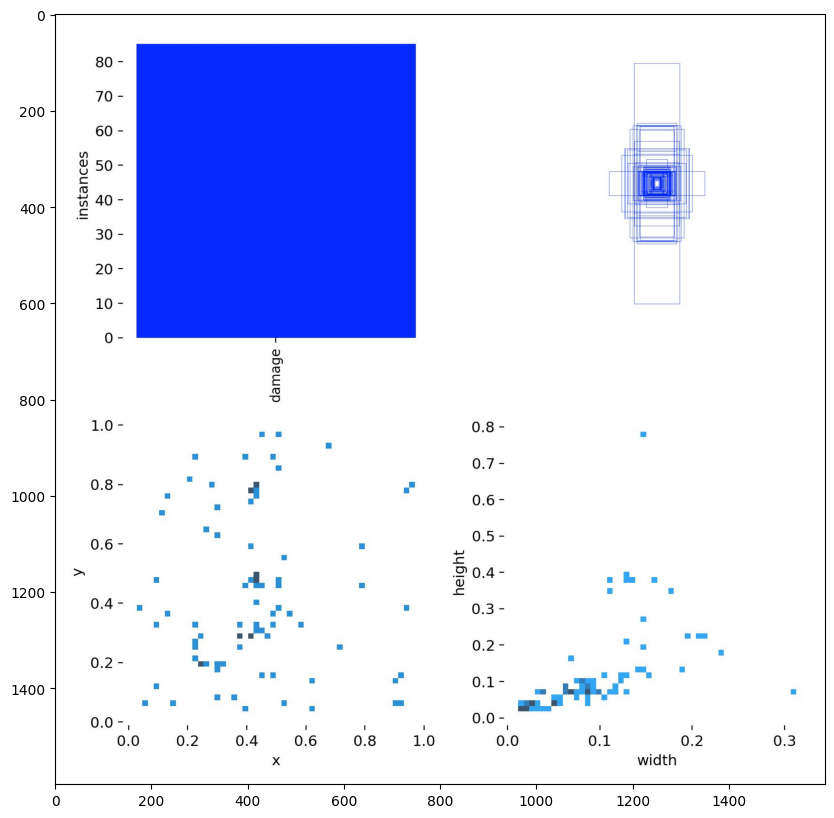

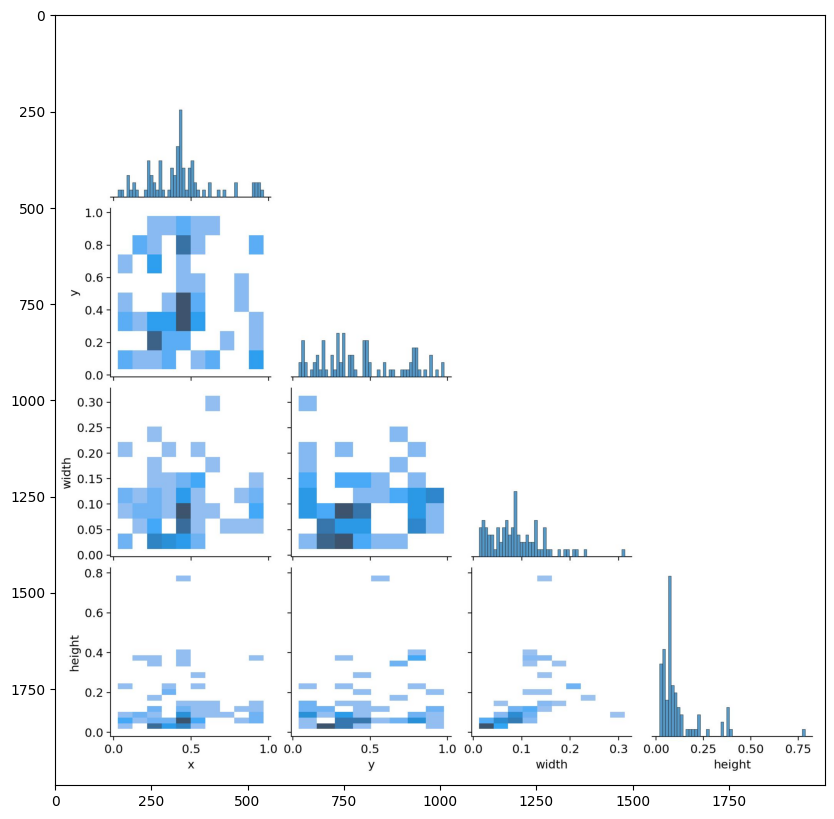

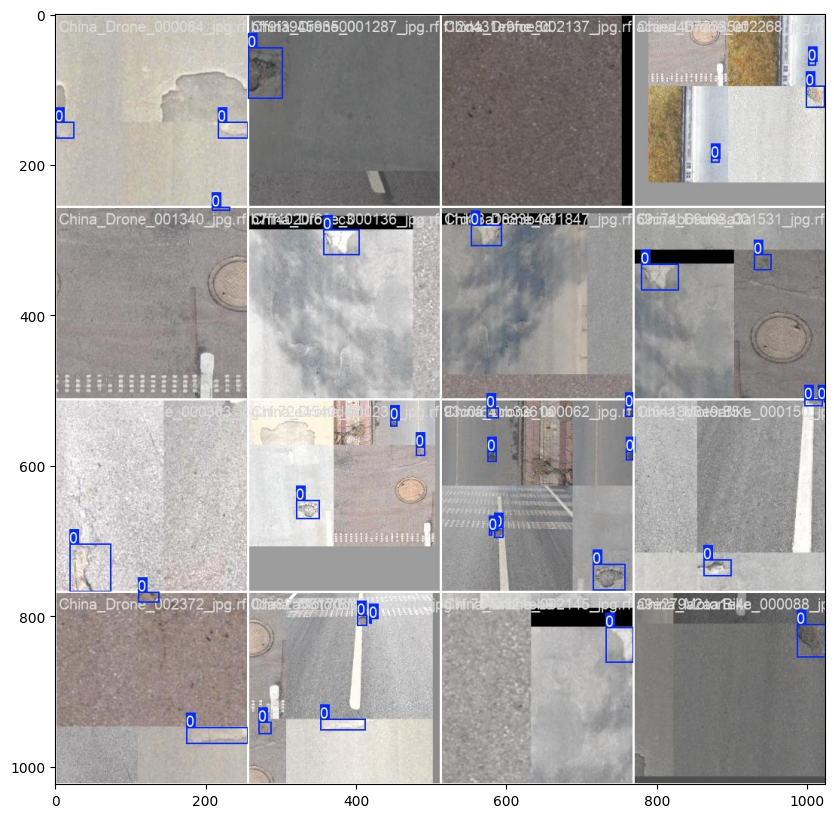

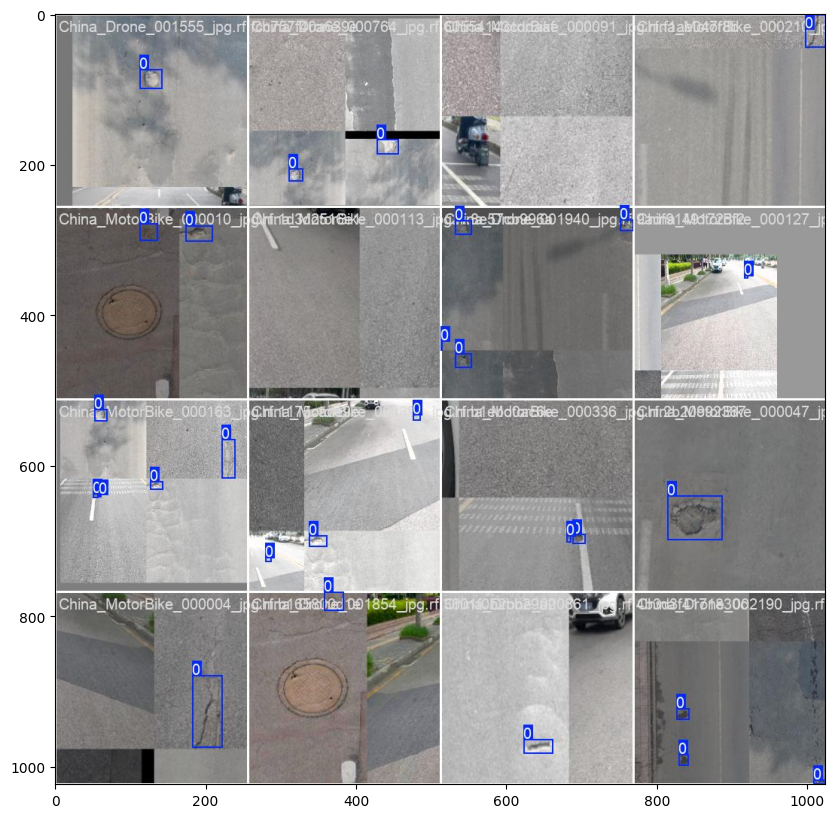

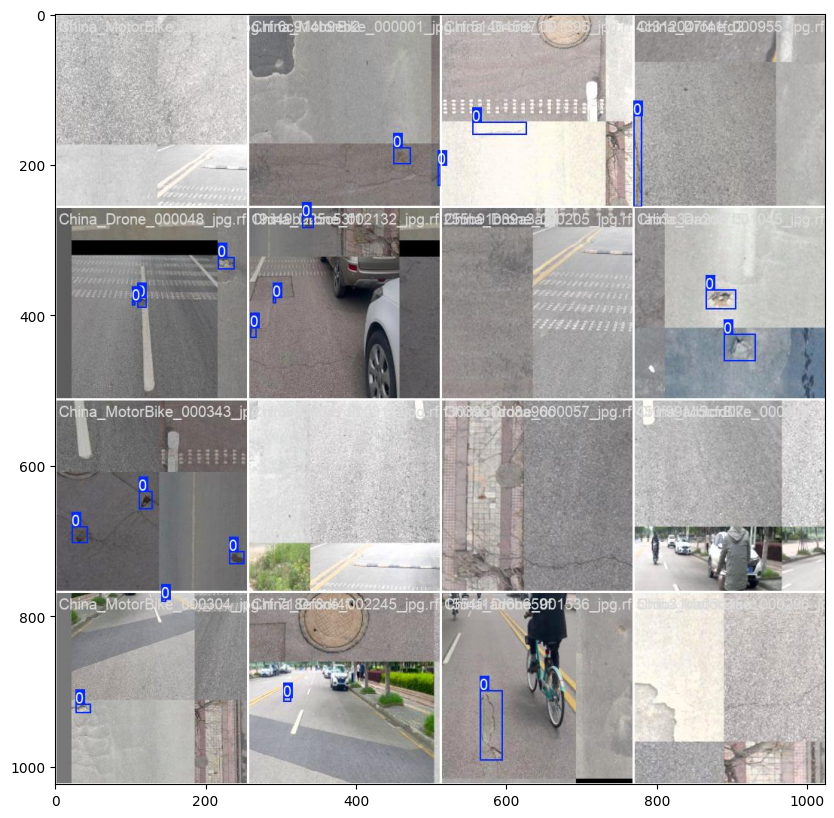

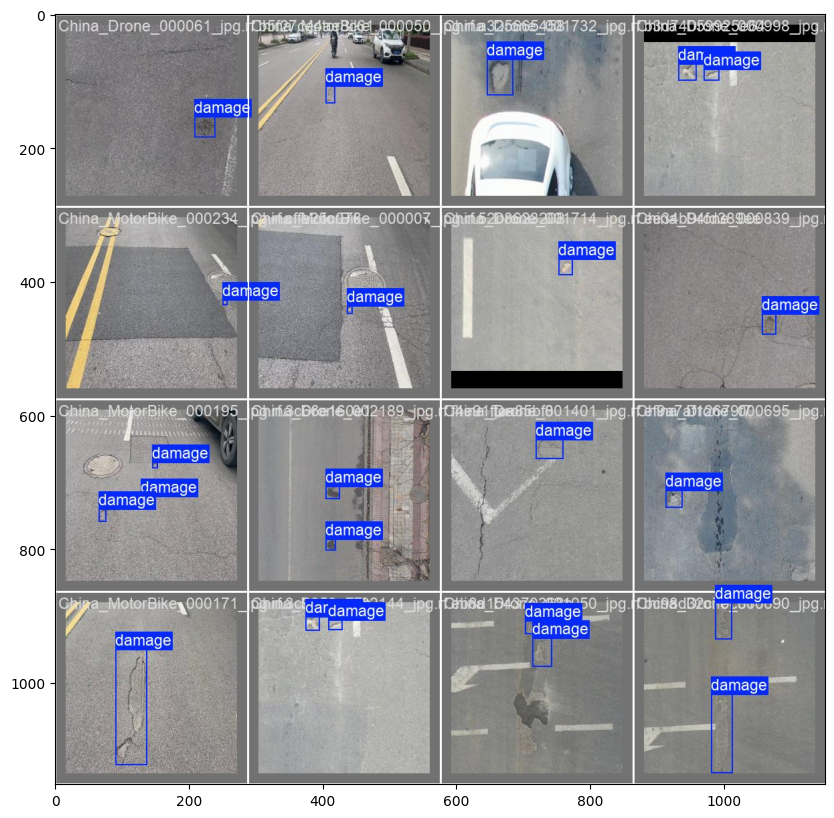

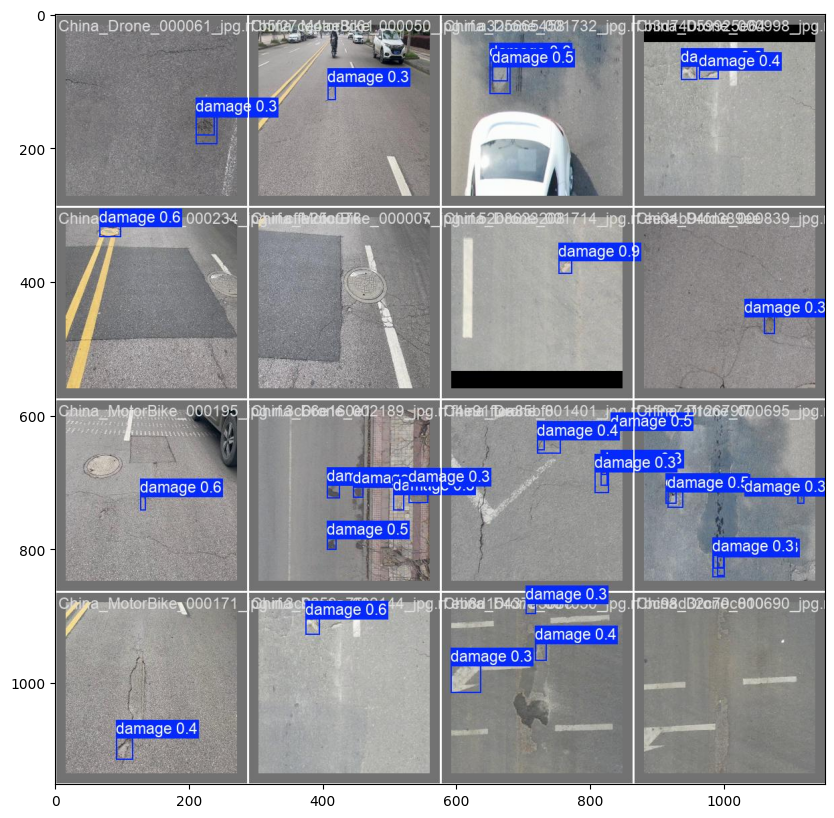

In [35]:
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show() 

Predict

In [36]:
best_path0='runs/detect/train2/weights/best.pt'
source0='datasets/test'

In [37]:
ppaths=[]
for dirname, _, filenames in os.walk(source0):
    for filename in filenames:
        if filename[-4:]=='.jpg':
            ppaths+=[(os.path.join(dirname, filename))]
ppaths=sorted(ppaths)
print(ppaths[0])
print(len(ppaths))

datasets/test\China_Drone_000160_jpg.rf.c6894a1415f96eee6a3d0c61b01de02e.jpg
20


In [38]:
model2 = YOLO(best_path0)

In [39]:
!yolo task=detect mode=predict model={best_path0} conf=0.1 source={source0}

Ultralytics YOLOv8.2.55 ðŸš€ Python-3.10.13 torch-2.3.1+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
Model summary (fused): 268 layers, 68,124,531 parameters, 0 gradients, 257.4 GFLOPs

image 1/20 C:\Users\kirth\datasets\test\China_Drone_000160_jpg.rf.c6894a1415f96eee6a3d0c61b01de02e.jpg: 256x256 (no detections), 1235.6ms
image 2/20 C:\Users\kirth\datasets\test\China_Drone_000383_jpg.rf.d5fdf922bc673a1043b993313bb95b19.jpg: 256x256 (no detections), 1332.1ms
image 3/20 C:\Users\kirth\datasets\test\China_Drone_000503_jpg.rf.b1f5c7d1a60be140fbf1b397b0aebdcc.jpg: 256x256 5 damages, 1311.3ms
image 4/20 C:\Users\kirth\datasets\test\China_Drone_000942_jpg.rf.a084dd23d19fef48fd4c3c2542b69aed.jpg: 256x256 2 damages, 1337.1ms
image 5/20 C:\Users\kirth\datasets\test\China_Drone_001067_jpg.rf.16480988cfd2a35f8c0e3def0ae63042.jpg: 256x256 2 damages, 1278.6ms
image 6/20 C:\Users\kirth\datasets\test\China_Drone_001446_jpg.rf.f2e35cd87f5e59176f3d57634867920f.jpg: 256x256 1 damage, 1375.9ms
imag

Result of Prediction

In [40]:
results = model2.predict(source0,conf=0.1)
print(len(results))


image 1/20 C:\Users\kirth\datasets\test\China_Drone_000160_jpg.rf.c6894a1415f96eee6a3d0c61b01de02e.jpg: 256x256 (no detections), 1417.0ms
image 2/20 C:\Users\kirth\datasets\test\China_Drone_000383_jpg.rf.d5fdf922bc673a1043b993313bb95b19.jpg: 256x256 (no detections), 1351.1ms
image 3/20 C:\Users\kirth\datasets\test\China_Drone_000503_jpg.rf.b1f5c7d1a60be140fbf1b397b0aebdcc.jpg: 256x256 5 damages, 1343.7ms
image 4/20 C:\Users\kirth\datasets\test\China_Drone_000942_jpg.rf.a084dd23d19fef48fd4c3c2542b69aed.jpg: 256x256 2 damages, 1336.1ms
image 5/20 C:\Users\kirth\datasets\test\China_Drone_001067_jpg.rf.16480988cfd2a35f8c0e3def0ae63042.jpg: 256x256 2 damages, 1315.3ms
image 6/20 C:\Users\kirth\datasets\test\China_Drone_001446_jpg.rf.f2e35cd87f5e59176f3d57634867920f.jpg: 256x256 1 damage, 1368.2ms
image 7/20 C:\Users\kirth\datasets\test\China_Drone_001511_jpg.rf.9bec02afb7e51d9818a12853c4281157.jpg: 256x256 1 damage, 1314.1ms
image 8/20 C:\Users\kirth\datasets\test\China_Drone_001522_jpg.rf

In [41]:
print((results[0].boxes.data))

tensor([], size=(0, 6))


In [44]:


# Initialize an empty list to collect DataFrames
df_list = []

# Loop through results to create individual DataFrames and append them to the list
for i in range(len(results)):
    arri = pd.DataFrame(results[i].boxes.data.cpu().numpy()).astype(float)
    path = ppaths[i]
    file = path.split('/')[-1]
    arri = arri.assign(file=file, i=i)
    df_list.append(arri)

# Concatenate all DataFrames into one
PBOX = pd.concat(df_list, axis=0)

# Rename columns
PBOX.columns = ['x', 'y', 'x2', 'y2', 'confidence', 'class', 'file', 'i']

# Display the DataFrame
display(PBOX)


,x,y,x2,y2,confidence,class,file,i
0,359.330444,1010.359192,476.919098,1147.467651,0.632139,0.0,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
1,975.479553,49.302486,1184.260376,128.375809,0.431043,0.0,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
2,961.929077,9.754515,1188.070312,122.940758,0.254092,0.0,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
3,295.158600,0.000000,400.703949,71.292351,0.171545,0.0,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
4,213.661728,878.060425,383.608154,1018.814209,0.169825,0.0,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
0,1234.720825,718.703064,1278.901123,811.279846,0.269688,0.0,test\China_Drone_000942_jpg.rf.a084dd23d19fef4...,3
1,399.480194,246.383530,515.580994,570.359009,0.235788,0.0,test\China_Drone_000942_jpg.rf.a084dd23d19fef4...,3
0,711.499939,616.415466,859.059448,779.158691,0.353894,0.0,test\China_Drone_001067_jpg.rf.16480988cfd2a35...,4
1,704.369568,622.472778,859.965149,833.229309,0.131581,0.0,test\China_Drone_001067_jpg.rf.16480988cfd2a35...,4
0,988.845032,66.967903,1059.716675,186.160645,0.266236,0.0,test\China_Drone_001446_jpg.rf.f2e35cd87f5e591...,5


In [46]:
class_map = {
    0: 'class_zero',
    1: 'class_one',
    2: 'class_two',
    # Add more class mappings as needed
}
PBOX['class']=PBOX['class'].apply(lambda x: class_map[int(x)])
PBOX=PBOX.reset_index(drop=True)
display(PBOX)
display(PBOX['class'].value_counts())

,x,y,x2,y2,confidence,class,file,i
0,359.330444,1010.359192,476.919098,1147.467651,0.632139,class_zero,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
1,975.479553,49.302486,1184.260376,128.375809,0.431043,class_zero,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
2,961.929077,9.754515,1188.070312,122.940758,0.254092,class_zero,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
3,295.158600,0.000000,400.703949,71.292351,0.171545,class_zero,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
4,213.661728,878.060425,383.608154,1018.814209,0.169825,class_zero,test\China_Drone_000503_jpg.rf.b1f5c7d1a60be14...,2
5,1234.720825,718.703064,1278.901123,811.279846,0.269688,class_zero,test\China_Drone_000942_jpg.rf.a084dd23d19fef4...,3
6,399.480194,246.383530,515.580994,570.359009,0.235788,class_zero,test\China_Drone_000942_jpg.rf.a084dd23d19fef4...,3
7,711.499939,616.415466,859.059448,779.158691,0.353894,class_zero,test\China_Drone_001067_jpg.rf.16480988cfd2a35...,4
8,704.369568,622.472778,859.965149,833.229309,0.131581,class_zero,test\China_Drone_001067_jpg.rf.16480988cfd2a35...,4
9,988.845032,66.967903,1059.716675,186.160645,0.266236,class_zero,test\China_Drone_001446_jpg.rf.f2e35cd87f5e591...,5


class
class_zero    42
Name: count, dtype: int64

In [57]:
def draw_box2(n0):
    
    ipath=ppaths[n0]
    image=cv2.imread(ipath)
    H,W=image.shape[0],image.shape[1]
    file=ipath.split('/')[-1]
    
    if PBOX[PBOX['file']==file] is not None:
        box=PBOX[PBOX['file']==file]
        box=box.reset_index(drop=True)
        #display(box)

        for i in range(len(box)):
            label=box.loc[i,'class']
            x=int(box.loc[i,'x'])
            y=int(box.loc[i,'y'])
            x2=int(box.loc[i,'x2']) 
            y2=int(box.loc[i,'y2'])
            #print(label,x,y,x2,y2)
            #cv2.putText(image, f'{label}', (x, int(y-4)), 
            #            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,0),2)
            cv2.rectangle(image,(x,y),(x2,y2),(0,255,0),2) #green
    
        plt.imshow(image)
    plt.show()   
    
    return image

In [48]:
def create_animation(ims):
    fig=plt.figure(figsize=(12,8))
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    text = plt.text(0.05, 0.05, f'Slide {0}', transform=fig.transFigure, fontsize=14, color='blue')
    plt.axis('off')
    plt.close()

    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        text.set_text(f'Slide {i}')        
        return [im]    
    
    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000)

In [49]:
images2=[]
for i in tqdm(range(len(ppaths))):
    images2+=[draw_box2(i)]

100%|██████████| 20/20 [00:00<00:00, 27.54it/s]


In [50]:
create_animation(images2)